<a href="https://colab.research.google.com/github/sohailpk84-max/pakgeek/blob/main/FinalResearch_(2).ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In this below code following models are developed for training, validation and testing. Bagging, Boosting(Adaboost, Gradient Boost, XGBoost, LightBoost, Stacking.

**With these Conditions.**
1. finding top three features based on accracy.
2. Giving weights to all features.
3. forward selection technique is used to add remining features to check if the performance is changed.
4. split data at ratio 60:20:20
5. In the end finding the best performing model based on test accuracy.

**No Issues Observed**
1. Stack issue is resolved and accepted XGBoost and displays the output when included.
2. All models should use weighting mechanizism so that hightest weights for features are chosen for training, validation and testing.
3. Logic checked and revalidated.

In [ ]:
pip install xgboost==1.7.6 scikit-learn==1.2.2

In [ ]:
# Import necessary libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.ensemble import (
    RandomForestClassifier,
    BaggingClassifier,
    GradientBoostingClassifier,
    AdaBoostClassifier,
    StackingClassifier,
)
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import (
    accuracy_score,
    precision_score,
    f1_score,
    roc_auc_score,
    confusion_matrix,
    ConfusionMatrixDisplay,
)
from sklearn.base import clone
from sklearn.preprocessing import LabelEncoder
from tabulate import tabulate
import warnings

warnings.filterwarnings("ignore", category=UserWarning)
warnings.filterwarnings("ignore", category=FutureWarning)

/usr/local/lib/python3.11/dist-packages/dask/dataframe/__init__.py:42: FutureWarning: 
Dask dataframe query planning is disabled because dask-expr is not installed.

You can install it with `pip install dask[dataframe]` or `conda install dask`.
This will raise in a future version.

  warnings.warn(msg, FutureWarning)


In [ ]:
# Load the dataset
file_path = "/content/data_synth.csv"
data = pd.read_csv(file_path)
#######################################
# Rename columns for clarity
column_mapping = {
    'age': 'age',
    'bp': 'blood_pressure',
    'sg': 'specific_gravity',
    'al': 'albumin',
    'su': 'sugar',
    'rbc': 'red_blood_cells',
    'pc': 'pus_cell',
    'pcc': 'pus_cell_clumps',
    'ba': 'bacteria',
    'bgr': 'blood_glucose_random',
    'bu': 'blood_urea',
    'sc': 'serum_creatinine',
    'sod': 'sodium',
    'pot': 'potassium',
    'hemo': 'hemoglobin',
    'pcv': 'packed_cell_volume',
    'wc': 'white_blood_cell_count',
    'rc': 'red_blood_cell_count',
    'htn': 'hypertension',
    'dm': 'diabetes_mellitus',
    'cad': 'coronary_artery_disease',
    'appet': 'appetite',
    'pe': 'pedal_edema',
    'ane': 'anemia',
    'classification': 'class'
}
data.rename(columns=column_mapping, inplace=True)


In [ ]:

#######################################
# Data Preprocessing
if "id" in data.columns:
    data.drop(columns=["id"], inplace=True)
    print("'id' column removed.")
    print(data.columns)
    print(data.head())
    print(data.shape)
    print(data.info)
    print(data.describe())
    print(data.isnull().sum())


# Handle missing values
for col in data.columns:
    if data[col].dtype == "object":
        data[col].fillna(data[col].mode()[0], inplace=True)
    else:
        data[col].fillna(data[col].mean(), inplace=True)

# Label encoding for categorical variables
categorical_cols = data.select_dtypes(include=["object"]).columns
for col in categorical_cols:
    le = LabelEncoder()
    data[col] = le.fit_transform(data[col])
########################################################################

'id' column removed.
Index(['age', 'blood_pressure', 'specific_gravity', 'albumin', 'sugar',
       'red_blood_cells', 'pus_cell', 'pus_cell_clumps', 'bacteria',
       'blood_glucose_random', 'blood_urea', 'serum_creatinine', 'sodium',
       'potassium', 'hemoglobin', 'packed_cell_volume',
       'white_blood_cell_count', 'red_blood_cell_count', 'hypertension',
       'diabetes_mellitus', 'coronary_artery_disease', 'appetite',
       'pedal_edema', 'anemia', 'class'],
      dtype='object')
    age  blood_pressure  specific_gravity  albumin  sugar  red_blood_cells  \
0  48.0            80.0             1.020      1.0    0.0                1   
1   7.0            50.0             1.020      4.0    0.0                1   
2  62.0            80.0             1.010      2.0    3.0                1   
3  48.0            70.0             1.005      4.0    0.0                1   
4  51.0            80.0             1.010      2.0    0.0                1   

   pus_cell  pus_cell_clumps  bact

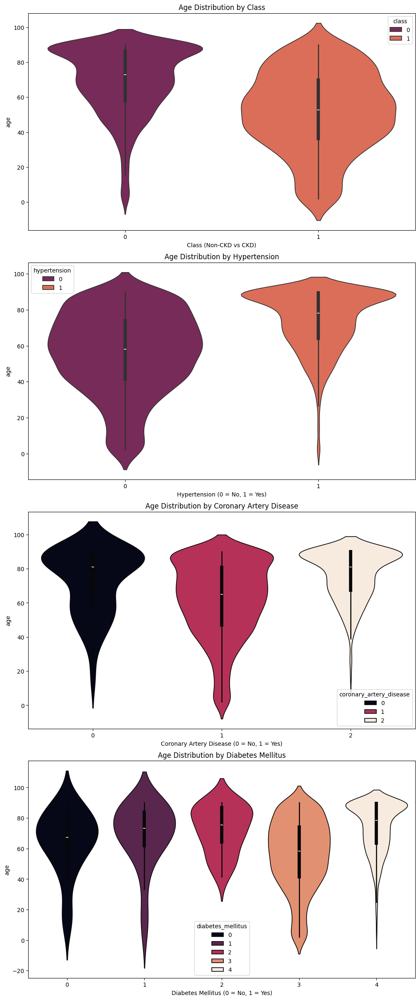

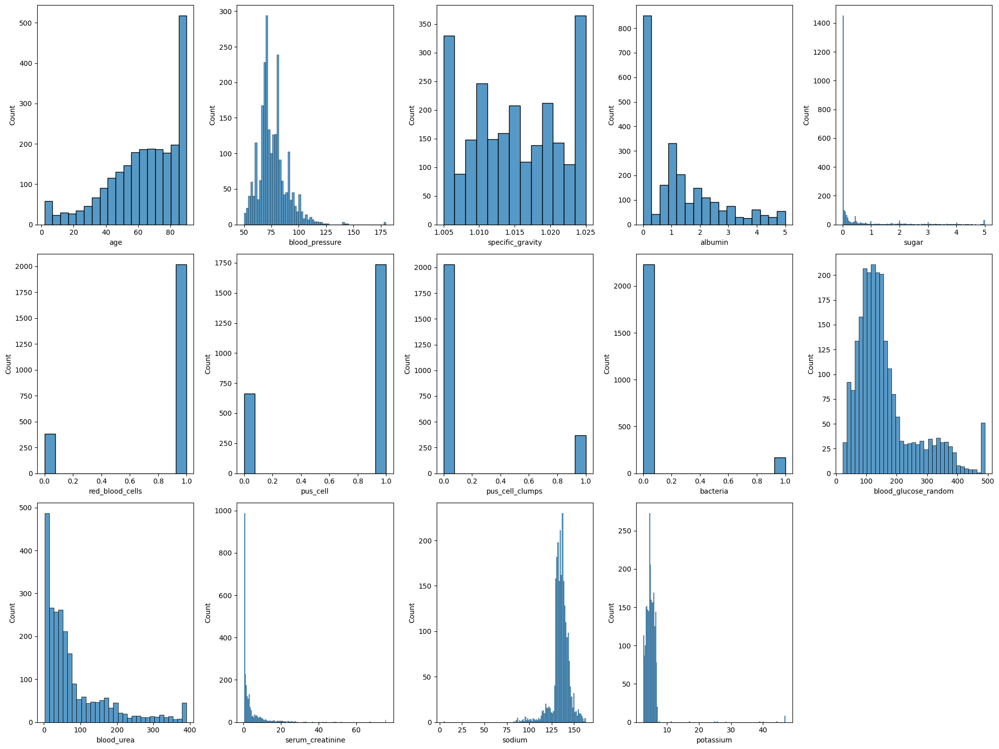

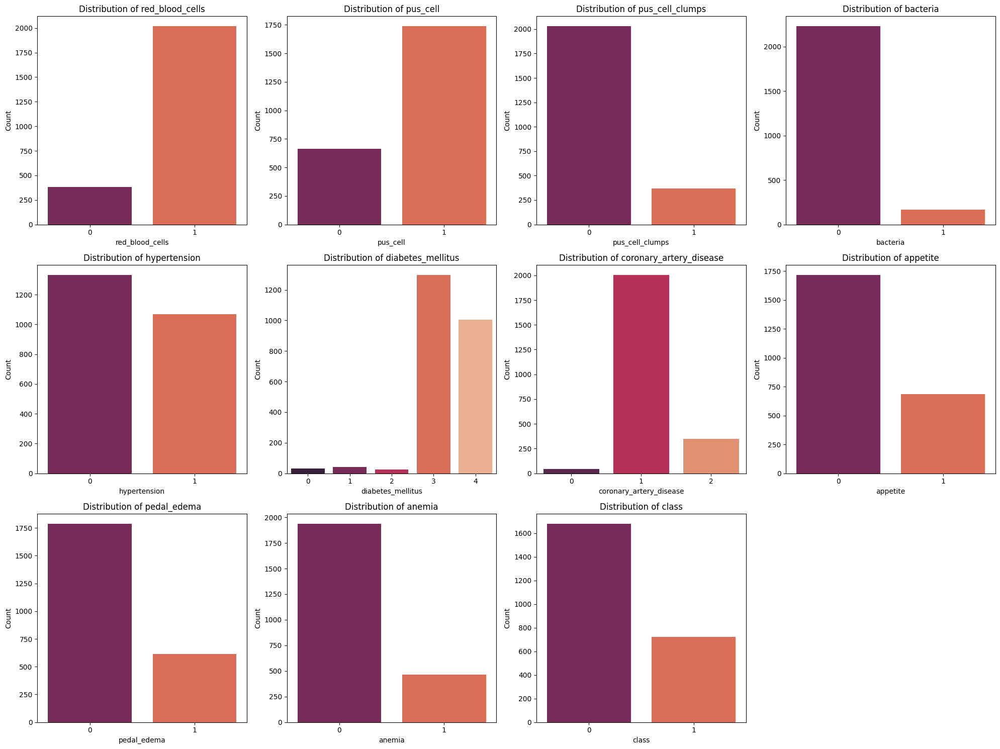

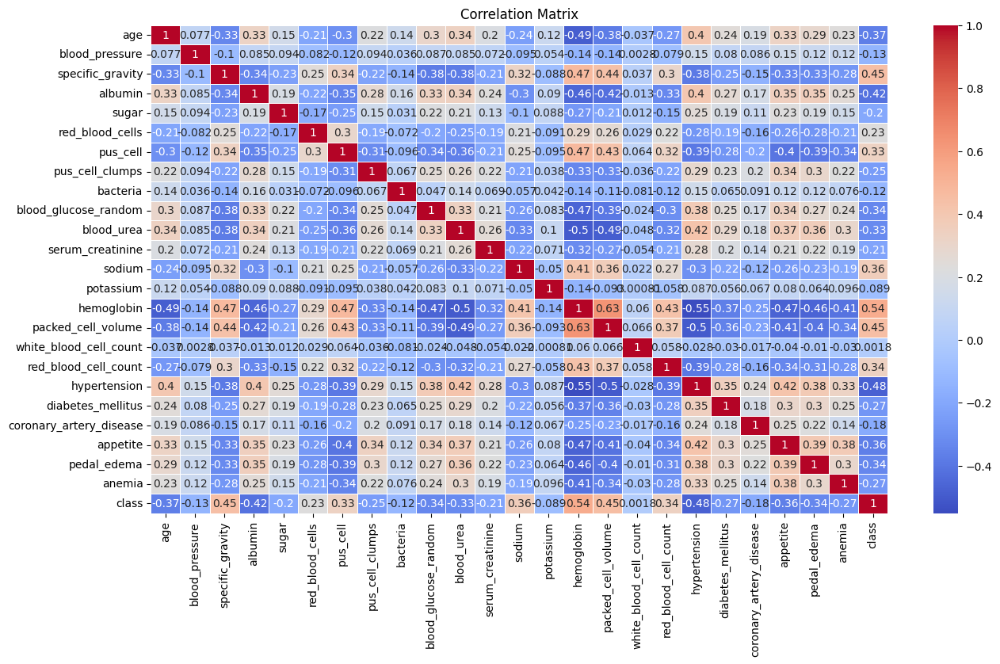

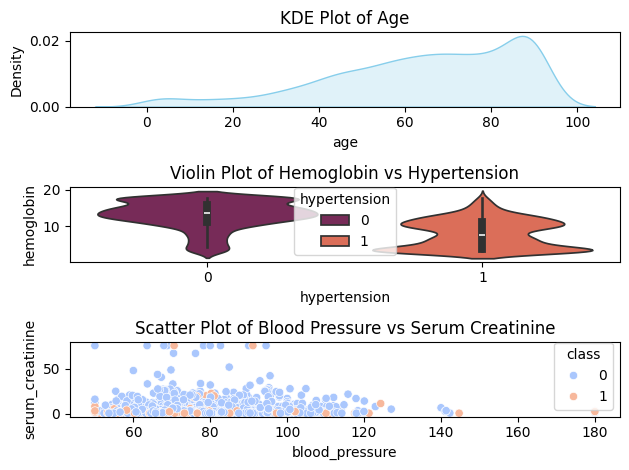

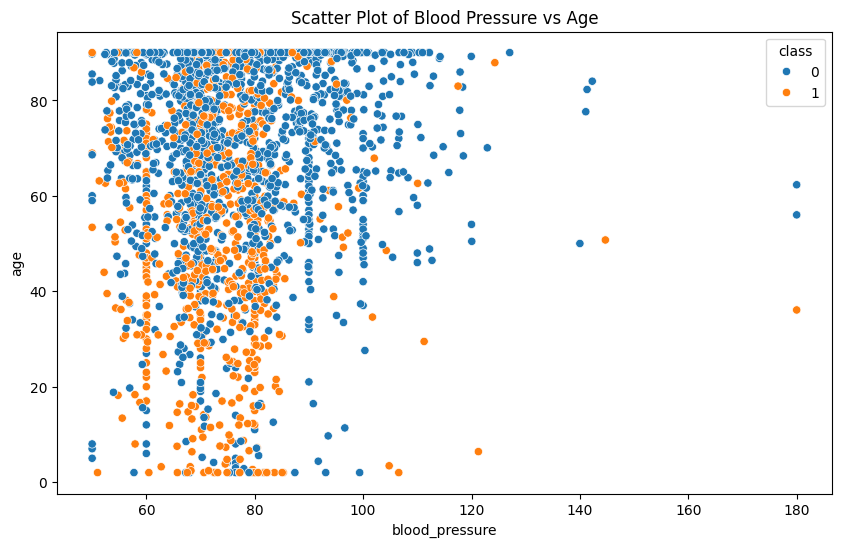

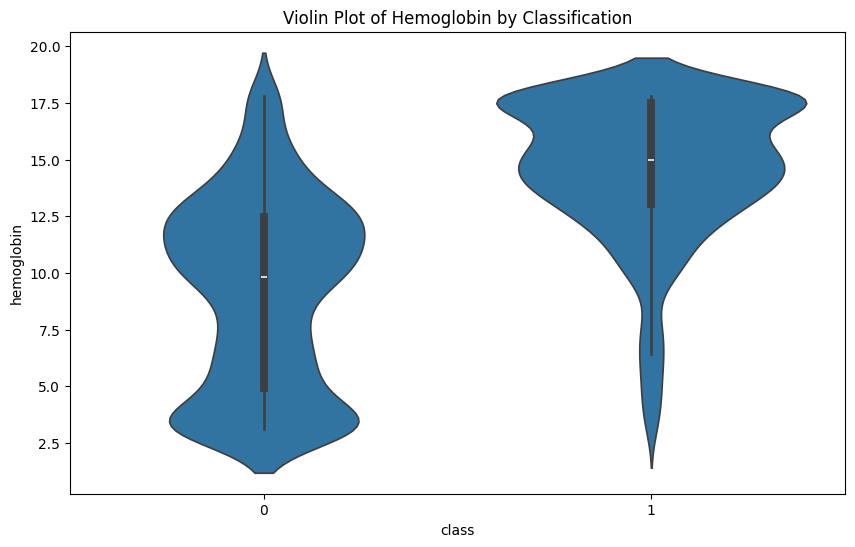

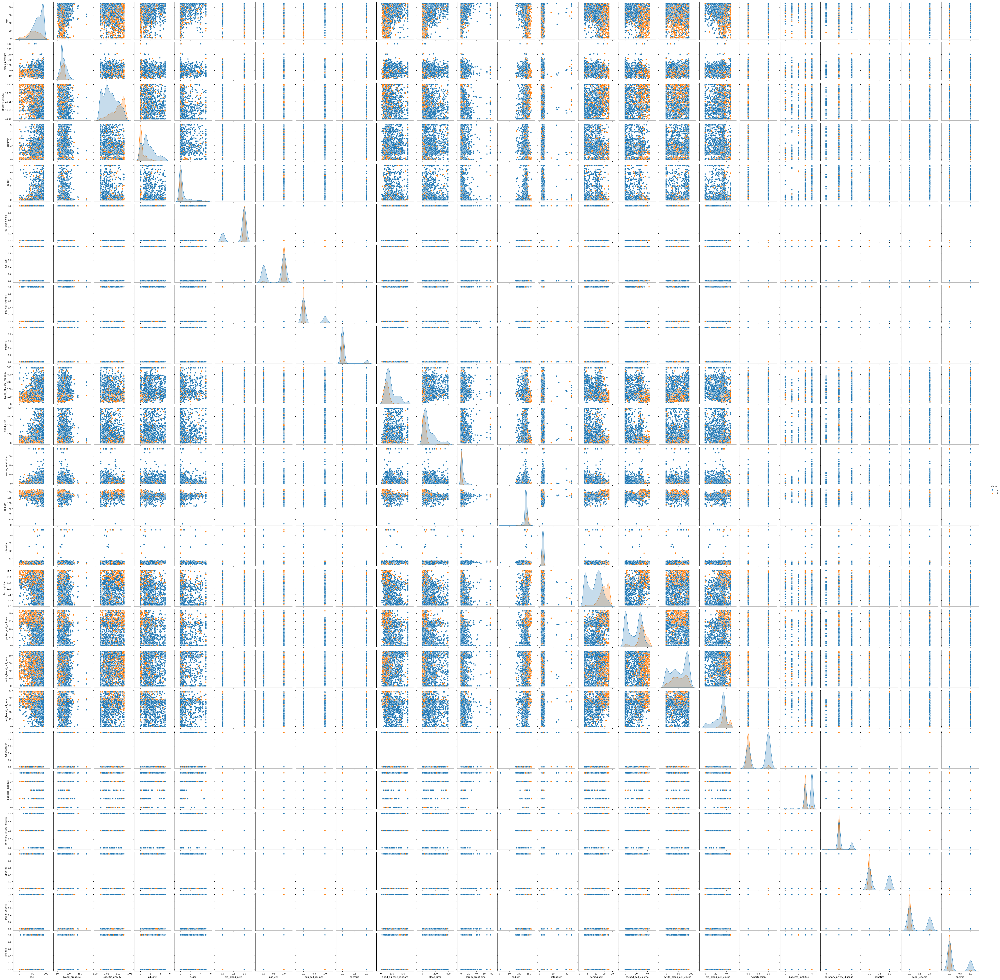

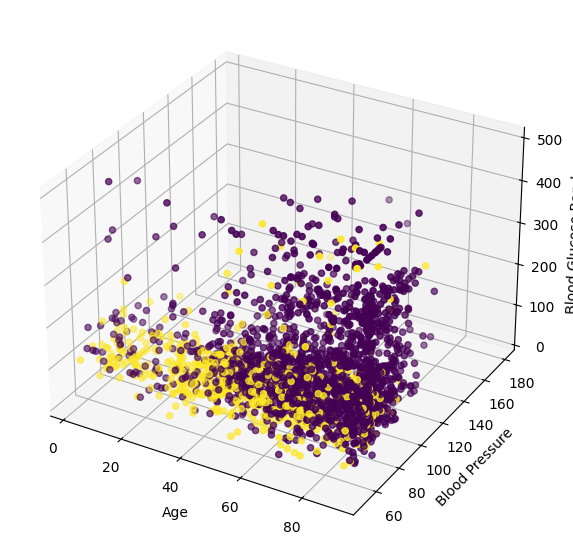

In [ ]:
# Create a vertical layout with subplots
fig, axes = plt.subplots(nrows=4, ncols=1, figsize=(10, 24), constrained_layout=True)

# Violin plot for 'class' vs. 'age'
sns.violinplot(ax=axes[0], x='class', y='age', hue='class', data=data, palette='rocket')
axes[0].set_title("Age Distribution by Class")
axes[0].set_xlabel("Class (Non-CKD vs CKD)")

# Violin plot for 'hypertension' vs. 'age'
sns.violinplot(ax=axes[1], x='hypertension', y='age', hue='hypertension', data=data, palette='rocket')
axes[1].set_title("Age Distribution by Hypertension")
axes[1].set_xlabel("Hypertension (0 = No, 1 = Yes)")

# Violin plot for 'coronary_artery_disease' vs. 'age'
sns.violinplot(ax=axes[2], x='coronary_artery_disease', y='age', hue='coronary_artery_disease', data=data, palette='rocket')
axes[2].set_title("Age Distribution by Coronary Artery Disease")
axes[2].set_xlabel("Coronary Artery Disease (0 = No, 1 = Yes)")

# Violin plot for 'diabetes_mellitus' vs. 'age'
sns.violinplot(ax=axes[3], x='diabetes_mellitus', y='age', hue='diabetes_mellitus', data=data, palette='rocket')
axes[3].set_title("Age Distribution by Diabetes Mellitus")
axes[3].set_xlabel("Diabetes Mellitus (0 = No, 1 = Yes)")

# Show the plots
plt.show()


# Numeric Features Histogram
plt.figure(figsize = (20, 15))
plotnumber = 1

#for column in num_cols:
for col in data.columns:
    if data[col].dtype != 'object':
        if plotnumber <= 14:
            ax = plt.subplot(3, 5, plotnumber)
            sns.histplot(data[col])
            plt.xlabel(col)
        plotnumber += 1
plt.tight_layout()
plt.show()

# Categorical Features Count Plot
# Assuming `data` is your dataframe
categorical_cols = [col for col in data.columns if data[col].nunique() < 20]

if len(categorical_cols) == 0:
    print("No categorical-like columns detected in the dataset!")
else:
    # Calculate rows and columns for subplots
    num_cols = 4  # Number of columns in the grid
    num_rows = -(-len(categorical_cols) // num_cols)  # Ceiling division to get rows

    plt.figure(figsize=(20, 5 * num_rows))  # Adjust height dynamically

    for i, col in enumerate(categorical_cols, 1):
        plt.subplot(num_rows, num_cols, i)
        sns.countplot(data=data, x=col, palette='rocket')
        plt.title(f"Distribution of {col}")
        plt.xlabel(col)
        plt.ylabel('Count')

    plt.tight_layout()
    plt.show()

# Heatmap of Correlations
plt.figure(figsize=(15, 8))
sns.heatmap(data.corr(numeric_only=True), annot=True, cmap='coolwarm', linewidths=0.5)
plt.title("Correlation Matrix")
plt.show()

#KDE Plot for age
plt.subplot(3, 1, 1)
sns.kdeplot(data['age'], fill=True, color='skyblue')
plt.title("KDE Plot of Age")

#Violin Plot for Hemoglobin and Hpertension
plt.subplot(3, 1, 2)
sns.violinplot(x='hypertension', y='hemoglobin',hue='hypertension', data=data, palette='rocket')
plt.title("Violin Plot of Hemoglobin vs Hypertension")

#Scatter Plot of blood_pressure vs. serum_creatinine
plt.subplot(3, 1, 3)
sns.scatterplot(x='blood_pressure', y='serum_creatinine', hue='class', data=data, palette='coolwarm')
plt.title("Scatter Plot of Blood Pressure vs Serum Creatinine")
plt.tight_layout()
plt.show()

#Scatter Plot of blood_pressure vs. age by class
plt.figure(figsize=(10, 6))
sns.scatterplot(x='blood_pressure', y='age', hue='class', data=data)
plt.title("Scatter Plot of Blood Pressure vs Age")
plt.show()

#Violin Plot of hemoglobin by class
plt.figure(figsize=(10, 6))
sns.violinplot(x='class', y='hemoglobin', data=data)
plt.title("Violin Plot of Hemoglobin by Classification")
plt.show()

#Pair Plot
sns.pairplot(data, hue='class', diag_kind='kde')
plt.show()

#3D Scatter Plot
from mpl_toolkits.mplot3d import Axes3D
fig = plt.figure(figsize=(10, 7))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(data['age'], data['blood_pressure'], data['blood_glucose_random'], c=pd.factorize(data['class'])[0], cmap='viridis')
ax.set_xlabel('Age')
ax.set_ylabel('Blood Pressure')
ax.set_zlabel('Blood Glucose Random')
plt.show()

In [ ]:
#######################################################################
# Feature and target separation
X = data.drop(columns=["class"])
y = data["class"]

# Train-validation-test split (60:20:20)
X_train, X_temp, y_train, y_temp = train_test_split(
    X, y, test_size=0.4, random_state=42, stratify=y
)
X_val, X_test, y_val, y_test = train_test_split(
    X_temp, y_temp, test_size=0.5, random_state=42, stratify=y_temp
)


In [ ]:
# Feature weighting based on Random Forest importance
rf_model = RandomForestClassifier(random_state=42).fit(X_train, y_train)
feature_weights = rf_model.feature_importances_ / rf_model.feature_importances_.sum()
X_train_weighted = X_train.copy()
X_val_weighted = X_val.copy()
X_test_weighted = X_test.copy()
for i, col in enumerate(X_train.columns):
    X_train_weighted[col] *= feature_weights[i]
    X_val_weighted[col] *= feature_weights[i]
    X_test_weighted[col] *= feature_weights[i]

In [ ]:

# Top-3 features based on accuracy
def select_top_k_features(X, y, k, model):
    feature_scores = {}
    for feature in X.columns:
        X_single = X[[feature]]
        model_clone = clone(model)
        model_clone.fit(X_single, y)
        y_pred = model_clone.predict(X_single)
        acc = accuracy_score(y, y_pred)
        feature_scores[feature] = acc
    sorted_features = sorted(feature_scores, key=feature_scores.get, reverse=True)
    return sorted_features[:k]

In [ ]:
# Forward selection
def forward_selection(X, y, initial_features, model):
    selected_features = list(initial_features)
    remaining_features = list(set(X.columns) - set(initial_features))
    best_accuracy = 0
    while remaining_features:
        feature_to_add = None
        for feature in remaining_features:
            current_features = selected_features + [feature]
            model_clone = clone(model)
            model_clone.fit(X[current_features], y)
            y_pred = model_clone.predict(X[current_features])
            acc = accuracy_score(y, y_pred)
            if acc > best_accuracy:
                best_accuracy = acc
                feature_to_add = feature
        if feature_to_add:
            selected_features.append(feature_to_add)
            remaining_features.remove(feature_to_add)
        else:
            break
    return selected_features

In [ ]:
# Models and parameters
models = {
    "Bagging": BaggingClassifier(estimator=DecisionTreeClassifier(), random_state=42),
    "Gradient Boosting": GradientBoostingClassifier(random_state=42),
    "AdaBoost": AdaBoostClassifier(random_state=42),
    "LightGBM": LGBMClassifier(random_state=42),
    "Decision Tree": DecisionTreeClassifier(random_state=42),
    "Random Forest": RandomForestClassifier(random_state=42),
    "XGBoost": XGBClassifier(eval_metric="logloss", random_state=42),
}
param_grids = {
    "Bagging": {
        "n_estimators": [10, 50, 100],
        "estimator__max_depth": [3, 5, 10],
    },
    "Gradient Boosting": {
        "n_estimators": [50, 100],
        "learning_rate": [0.05, 0.1, 0.2],
        "max_depth": [3, 5],
    },
    "AdaBoost": {
        "n_estimators": [50, 100],
        "learning_rate": [0.05, 0.1, 0.2],
    },
    "LightGBM": {
        "n_estimators": [50, 100],
        "learning_rate": [0.05, 0.1, 0.2],
        "max_depth": [3, 5],
    },
    "Random Forest": {
        "n_estimators": [50, 100],
        "max_depth": [3, 5, 10],
        "min_samples_split": [2, 5, 10],
    },
    "Decision Tree": {
        "max_depth": [3, 5, 10],
        "min_samples_split": [2, 5, 10],
    },
}

In [ ]:
# Training and tuning models
best_estimators = {}
selected_features_per_model = {}
for model_name, model in models.items():
    try:
        top_3_features = select_top_k_features(X_train_weighted, y_train, 3, model)
        selected_features = forward_selection(X_train_weighted, y_train, top_3_features, model)
        X_train_selected = X_train_weighted[selected_features]
        X_val_selected = X_val_weighted[selected_features]
        if model_name in param_grids:
            grid_search = GridSearchCV(model, param_grids[model_name], cv=3, scoring="accuracy", n_jobs=-1)
            grid_search.fit(X_train_selected, y_train)
            best_estimators[model_name] = grid_search.best_estimator_
        else:
            model.fit(X_train_selected, y_train)
            best_estimators[model_name] = model
        selected_features_per_model[model_name] = selected_features
    except Exception as e:
        print(f"Error with {model_name}: {e}")

[LightGBM] [Info] Number of positive: 3000, number of negative: 3000
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000472 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 89
[LightGBM] [Info] Number of data points in the train set: 6000, number of used features: 1
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Info] Number of positive: 3000, number of negative: 3000
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000173 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 12
[LightGBM] [Info] Number of data points in the train set: 6000, number of used features: 1
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: 

In [ ]:
# Stacking model
stacking_estimators = [
    ("bagging", best_estimators["Bagging"]),
    ("gradient_boosting", best_estimators["Gradient Boosting"]),
    ("adaboost", best_estimators["AdaBoost"]),
    ("lightgbm", best_estimators["LightGBM"]),
    ("random_forest", best_estimators["Random Forest"]),
    ("xgboost", best_estimators["XGBoost"]),
    ]
stacking_model = StackingClassifier(
    estimators=stacking_estimators,
    final_estimator=LogisticRegression(),
    passthrough=True,
    cv=5,
    n_jobs=-1,
)
stacking_model.fit(X_train_weighted, y_train)

StackingClassifier(cv=5,
                   estimators=[('bagging',
                                BaggingClassifier(estimator=DecisionTreeClassifier(max_depth=10),
                                                  n_estimators=100,
                                                  random_state=42)),
                               ('gradient_boosting',
                                GradientBoostingClassifier(learning_rate=0.2,
                                                           random_state=42)),
                               ('adaboost',
                                AdaBoostClassifier(learning_rate=0.2,
                                                   random_state=42)),
                               ('lightgbm',
                                LGBMClassifier(learning_rate=0.2, max_dep...
                                              interaction_constraints=None,
                                              learning_rate=None, max_bin=None,
                                              max_cat_threshold=None,
                                              max_cat_to_onehot=None,
                                              max_delta_step=None,
                                              max_depth=None, max_leaves=None,
                                              min_child_weight=None,
                                              missing=nan,
                                              monotone_constraints=None,
                                              n_estimators=100, n_jobs=None,
                                              num_parallel_tree=None,
                                              predictor=None, random_state=42, ...))],
                   final_estimator=LogisticRegression(), n_jobs=-1,
                   passthrough=True)

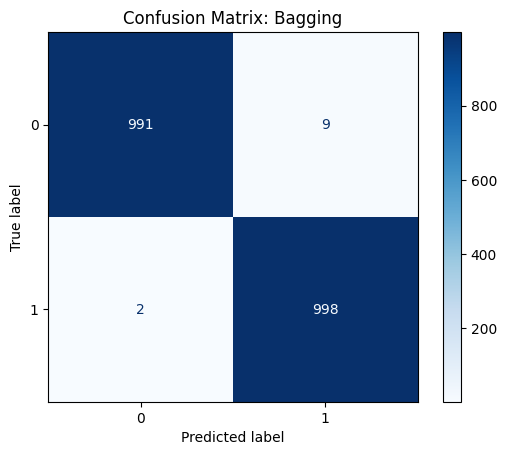

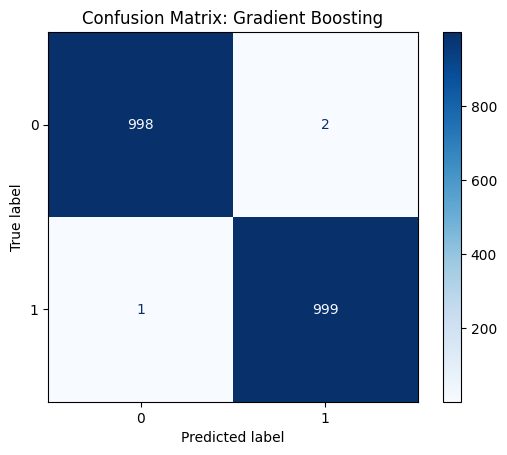

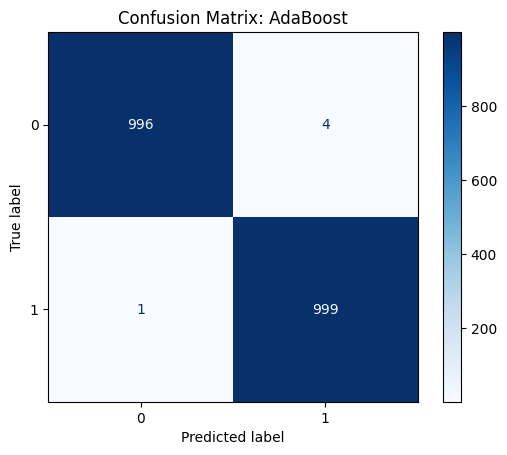

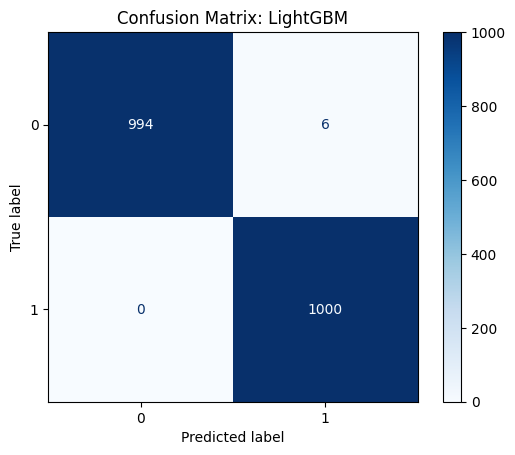

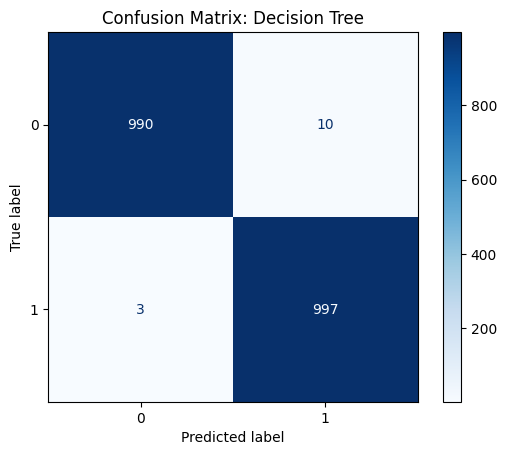

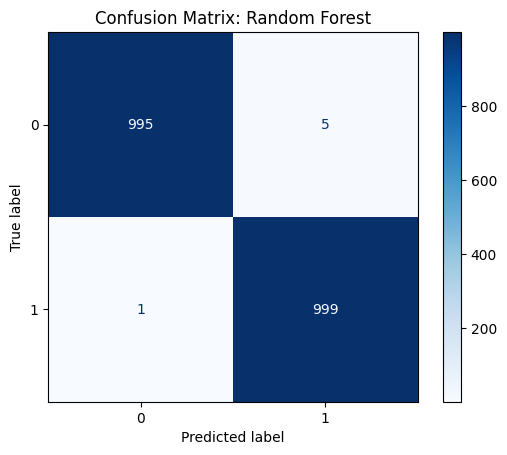

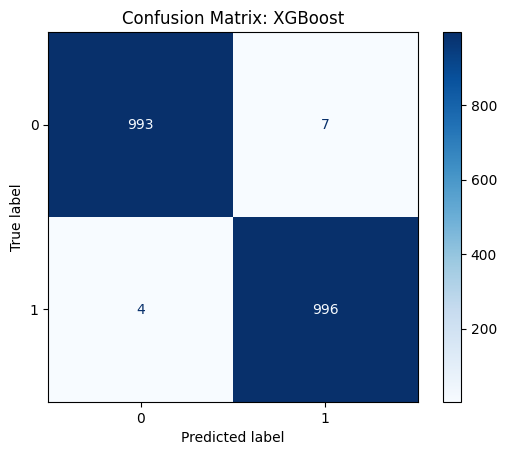

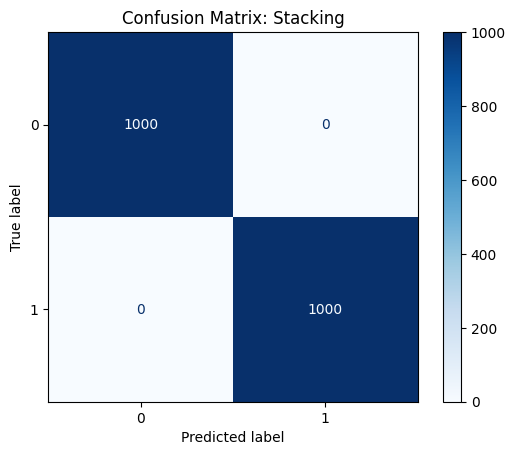

+----+--------+-------------------+------------+-------------+------------+-----------+
|    |   Rank | Model             |   Accuracy |   Precision |   F1-Score |   ROC-AUC |
+====+========+===================+============+=============+============+===========+
|  0 |      1 | Stacking          |     1      |    1        |   1        |  1        |
+----+--------+-------------------+------------+-------------+------------+-----------+
|  1 |      2 | Gradient Boosting |     0.9985 |    0.998002 |   0.998501 |  0.999996 |
+----+--------+-------------------+------------+-------------+------------+-----------+
|  2 |      3 | AdaBoost          |     0.9975 |    0.996012 |   0.997504 |  0.999981 |
+----+--------+-------------------+------------+-------------+------------+-----------+
|  3 |      4 | LightGBM          |     0.997  |    0.994036 |   0.997009 |  0.999979 |
+----+--------+-------------------+------------+-------------+------------+-----------+
|  4 |      5 | Random Forest   

In [ ]:
# Evaluate models with confusion matrices

def evaluate_and_plot_confusion_matrix(model, X_val, y_val, model_name):
    y_pred = model.predict(X_val)
    y_pred_proba = model.predict_proba(X_val)[:, 1] if hasattr(model, "predict_proba") else None
    accuracy = accuracy_score(y_val, y_pred)
    precision = precision_score(y_val, y_pred)
    f1 = f1_score(y_val, y_pred)
    roc_auc = roc_auc_score(y_val, y_pred_proba) if y_pred_proba is not None else "N/A"

    # Plot confusion matrix
    cm = confusion_matrix(y_val, y_pred)
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=np.unique(y_val))
    disp.plot(cmap='Blues', values_format='d')
    plt.title(f'Confusion Matrix: {model_name}')
    plt.show()

    return accuracy, precision, f1, roc_auc

    # Evaluate models with confusion matrices
evaluation_results = []
for model_name, model in best_estimators.items():
    try:
        acc, precision, f1, roc_auc = evaluate_and_plot_confusion_matrix(
            model,
            X_val_weighted[selected_features_per_model[model_name]],
            y_val,
            model_name,
        )
        evaluation_results.append({
            "Model": model_name,
            "Accuracy": acc,
            "Precision": precision,
            "F1-Score": f1,
            "ROC-AUC": roc_auc,
        })
    except Exception as e:
        print(f"Error evaluating {model_name}: {e}")

# Stacking evaluation
stacking_acc, stacking_precision, stacking_f1, stacking_roc_auc = evaluate_and_plot_confusion_matrix(
    stacking_model, X_val_weighted, y_val, "Stacking"
)
evaluation_results.append({
    "Model": "Stacking",
    "Accuracy": stacking_acc,
    "Precision": stacking_precision,
    "F1-Score": stacking_f1,
    "ROC-AUC": stacking_roc_auc,
})

# Create a DataFrame for evaluation results
results_df = pd.DataFrame(evaluation_results)

# Sort the DataFrame by Accuracy in descending order
results_df = results_df.sort_values(by="Accuracy", ascending=False).reset_index(drop=True)

# Add a rank column with ascending numbers
results_df.insert(0, "Rank", range(1, len(results_df) + 1))

# Display the updated table
print(tabulate(results_df, headers="keys", tablefmt="grid"))

# Find the best performing model based on accuracy
best_model = results_df.iloc[0]
print(f"\nBest Performing Model: {best_model['Model']} with Accuracy: {best_model['Accuracy']:.4f}")


# Find the best performing model based on accuracy
#best_model = max(evaluation_results, key=lambda x: x['Accuracy'])
#print(f"\nBest Performing Model: {best_model['Model']} with Accuracy: {best_model['Accuracy']:.4f}")